# Gpt-image-1.5 Prompting Guide ( 日本語・Colab対応版）

## このノートブックについて
本ノートブックは、openai-cookbook のプロンプトガイド用ノートブックをGoogle Colab 上で実行できるように調整したものです。

ライセンスはコピー元に準じて MIT License を継承しています。

以下は、元となったノートブックです。

<a target="_blank" href="https://colab.research.google.com/github/openai/openai-cookbook/blob/main/examples/multimodal/image-gen-1.5-prompting_guide.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" height="30"/>
</a>

サンプルとして使用している入力画像は、以下のリポジトリに含まれているものをコピーしています。  
https://github.com/openai/openai-cookbook/tree/main/images

---

## Colab での実行方法
1. 本ノートブックを Google Colab で開く  
2. Colab の「シークレット」に `OPENAI_API_KEY` を作成し、API キーを設定する  
3. 「3. Setup」ブロックを上から順に実行する  
   - このブロックには汎用関数の定義が含まれています

それ以降のブロックは基本的に独立して実行可能ですが、  
生成された画像を入力として利用するブロックについては、  
事前に画像生成ブロックを実行しておく必要があります。

---

## 実行時の注意点
生成済み画像に対して編集処理を行うサンプルについては、  
直前のブロックで画像が生成されていることが前提となります。

---

## 変更点・追加点
- ノートブック全体を日本語訳  
- Google Colab 環境向けにファイル入出力処理を変更
- ノートブック内に出力画像の表示（display)
- テキスト描写のあるサンプルは日本語描写を含めるブロックを追加

元のサンプルでは `images` フォルダ内の画像がサンプルとして表示されていましたが、  
本ノートブックではそれらを削除しています。  
代わりに、実行時に生成した画像を `display` で表示する構成に変更しています。

また、ファイル名は Colab のフォームフィールドから指定できるように変更しています。

---

## ファイル入出力について
実行時に Google Drive をマウントし、  
指定されたフォルダを入力・出力先として使用します。

フォルダが存在しない場合は自動的に作成されます。  
必要に応じてパスは変更してください。


## 1. Introduction

`gpt-image-1.5` は、プロダクション品質のビジュアルと、高いコントロール性をもつクリエイティブなワークフロー向けに設計された最新の画像生成モデルです。写実性、正確さ、編集容易性が大きく向上しており、プロフェッショナルなデザイン業務にも、反復的なコンテンツ制作にも適しています。前世代モデルと比べて写実性・正確さ・編集性が大幅に向上しており、高品質レンダリングと低レイテンシーの両方のユースケースをサポートします。

主な機能は次のとおりです：

- **高精細なフォトリアリズム**：自然なライティング、正確なマテリアル表現、豊かな色再現
- **柔軟な品質とレイテンシーのトレードオフ**：品質設定を下げても前世代モデルより高い視覚品質を保ちつつ、高速生成が可能
- **堅牢な顔とアイデンティティの保持**：編集やキャラクターの一貫性、多段階ワークフローで人物が破綻しにくい
- **信頼できるテキスト描画**：くっきりした文字、整ったレイアウト、画像内で十分なコントラスト
- **複雑な構造を持つビジュアル**：インフォグラフィック、図解、マルチパネル構成など
- **精密なスタイル制御とスタイル転写**：最小限のプロンプトで、ブランドデザインから美術的スタイルまで幅広く対応
- **強力な現実世界の知識と推論能力**：物体・環境・状況を正確に描写可能

このガイドでは、実際のプロダクションユースケースから得られたプロンプトパターン、ベストプラクティス、サンプルプロンプトを紹介します。


## 2. Prompting Fundamentals

* **Structure + goal:** プロンプトは一貫した順序（背景／シーン → 被写体 → 重要なディテール → 制約）で書き、意図する用途（広告、UI モック、インフォグラフィックなど）も明示して、『モード』と仕上がりレベルを指定します。複雑なリクエストでは、1 つの長い段落ではなく、短いラベル付きセクションや行区切りを使うとよいです。

* **Specificity + quality cues:** マテリアル、形状、質感、ビジュアル媒体（写真、水彩画、3D レンダーなど）を具体的に指定し、必要なときだけ狙いを絞った『品質レバー』（例：*film grain*、*textured brushstrokes*、*macro detail*）を追加します。フォトリアルを狙う場合、『8K/ultra-detailed』のような一般的な表現よりも、レンズ、絞りの雰囲気、ライティングなどのカメラ／構図用語の方が、リアリズムを安定してコントロールできます。

* **Latency vs fidelity**: レイテンシに敏感、あるいは大量生成が必要なユースケースでは、まず quality="low" から始めて、要件を満たすか評価してください。多くの場合、十分な画質を保ったまま、生成を大幅に高速化できます。

* **Composition:** フレーミングと視点（クローズアップ、ワイド、トップダウン）、パース・アングル（アイレベル、ローアングル）、ライティングやムード（ソフトで拡散した光、ゴールデンアワー、ハイコントラストなど）を指定して、ショットを制御します。レイアウトが重要な場合は、『ロゴは右上』『被写体は中央、左側に余白』など、配置を明示します。

* **Constraints (what to change vs preserve):** 除外したいものと保持したいものを明確に書きます（例：『ウォーターマークなし』『余計なテキストなし』『ロゴ／商標なし』『アイデンティティ／ジオメトリ／レイアウト／ブランド要素を保持』など）。編集では、『変更するのは X のみ』+『それ以外はすべて同じに保つ』と書き、各イテレーションで保持したい項目を繰り返し指定すると、ドリフト（意図しない変化）を減らせます。

* **Text in images:** 画像内に入れたい文字は **引用符** や **ALL CAPS** で囲み、タイポグラフィ（フォントスタイル、サイズ、色、配置）を制約として指定します。ブランド名など難しい単語は、1 文字ずつスペルを指定すると文字の正確さが上がります。

* **Multi-image inputs:** 各入力画像を **番号と説明** で参照します（『Image 1: 商品写真…』『Image 2: スタイル参照…』など）。それらがどう相互作用するかも記述します（『Image 2 のスタイルを Image 1 に適用』など）。合成では、『Image 1 の鳥を Image 2 の象の上に乗せる』のように、どの要素をどこへ動かすか具体的に書いてください。

* **Iterate instead of overloading:** 最初はシンプルでクリーンなベースプロンプトから始め、小さな単位の変更（『ライティングを暖かく』『余計な木を消す』『元の背景を戻す』など）で段階的に調整します。『前と同じスタイルで』『the subject』といった参照を使ってコンテキストを活かしつつ、ドリフトしやすい重要な情報は、崩れ始めたら再度明示的に書き直します。


## 3. Setup

Run this once. It:
- API クライアントを作成します
- images フォルダ内に `output_images/` を作成します
- base64 画像を保存する小さなヘルパー関数を追加します

編集に使う参照画像は `input_images/` に入れておくか、サンプルコード内のパスを書き換えてください。


In [ ]:
# モジュールのインストール
!pip install openai

In [ ]:
# colab 初期設定（最初に1回だけ実行する）
import os
import base64
import json
import datetime
from pathlib import Path
from openai import OpenAI
from google.colab import userdata, drive
from IPython.display import Image, display
from typing import Tuple # Added import for Tuple
from PIL import Image as PILImage # Import PIL Image
import io # Import io for BytesIO

# Googleドライブを一度だけマウントする (すでにマウントされている場合はスキップ)
if not os.path.exists('/content/drive/MyDrive'):
    drive.mount('/content/drive')
else:
    print('Google Drive already mounted.')

# 保存先のディレクトリを設定する
IMAGE_DIR = '/content/drive/MyDrive/openai_example_images'  # @param {type:"string"}
INPUT_PATH = os.path.join(IMAGE_DIR, 'input_images')
OUTPUT_PATH = os.path.join(IMAGE_DIR, 'output_images')

os.makedirs(INPUT_PATH, exist_ok=True)
os.makedirs(OUTPUT_PATH, exist_ok=True)


# API接続の準備をするのだ
client = OpenAI(api_key=userdata.get('OPENAI_API_KEY'))


def check_openai_connection(client: OpenAI) -> Tuple[bool, str]:
    """OpenAI APIの接続確認を行うのだ"""
    try:
        response = client.models.list()
        models = [model.id for model in response.data]
        return True, f"OpenAI API 接続成功！利用可能なモデル数: {len(models)}"
    except Exception as e:
        return False, f"OpenAI API 接続失敗: {str(e)}"


# Loop over all parts and display them either as text or images
def display_result(result, max_height: int = 400):
  # レスポンスを確認して画像を表示するのだ！
    image_data = result.data[0].b64_json
    image_bytes = base64.b64decode(image_data)

    # Check image dimensions and resize if necessary
    img = PILImage.open(io.BytesIO(image_bytes))
    original_width, original_height = img.size

    if original_height > max_height:
        # Calculate new width to maintain aspect ratio
        aspect_ratio = original_width / original_height
        new_height = max_height
        new_width = int(new_height * aspect_ratio)
        img = img.resize((new_width, new_height), PILImage.LANCZOS)

        # Save the resized image to bytes
        buffered = io.BytesIO()
        img.save(buffered, format="PNG") # Assuming PNG for generated images
        image_bytes = buffered.getvalue()

    display(Image(data=image_bytes))

def display_from_file(filepath: str) -> None:


    try:
        with open(filepath, "rb") as f:
            image_bytes = f.read()

        img = PILImage.open(io.BytesIO(image_bytes))
        original_width, original_height = img.size
        max_height = 400 # Changed from 800 to 400 as requested

        if original_height > max_height:
            aspect_ratio = original_width / original_height
            new_height = max_height
            new_width = int(new_height * aspect_ratio)
            img = img.resize((new_width, new_height), PILImage.LANCZOS)

            buffered = io.BytesIO()
            img.save(buffered, format="PNG")
            image_bytes = buffered.getvalue()

        display(Image(data=image_bytes))
    except FileNotFoundError:
        print(f"Error: File not found at {filepath}")
    except Exception as e:
        print(f"Error displaying image from file {filepath}: {e}")


def save_image(result, filename: str) -> None:
    """
    Saves the first returned image to the given filename inside the output_images folder.
    """
    image_base64 = result.data[0].b64_json
    out_path = os.path.join(OUTPUT_PATH, filename)
    try:
        with open(out_path, "wb") as f:
            f.write(base64.b64decode(image_base64))
        print(f"Image saved successfully to {out_path}")
    except Exception as e:
        print(f"Error saving image to {out_path}: {e}")


def save_image_n(result, filename_prefix: str, file_ext:str) -> None:
    """
    Saves all returned images to separate files inside the output_images folder,
    using a filename prefix and numerical suffix.
    """
    for i, item in enumerate(result.data, start=1):
        image_base64 = item.b64_json
        out_path = os.path.join(OUTPUT_PATH, f"{filename_prefix}_{i}.{file_ext}")
        try:
            with open(out_path, "wb") as f:
                f.write(base64.b64decode(image_base64))
            print(f"Image {i} saved successfully to {out_path}")
        except Exception as e:
            print(f"Error saving image {i} to {out_path}: {e}")



# OpenAI 接続確認
is_ok, message = check_openai_connection(client)
print(message)

# Removed the call to quick_chat_test as it is not defined.
# if is_ok:
#     is_ok, message = quick_chat_test(client)
#     print(message)


Mounted at /content/drive
OpenAI API 接続成功！利用可能なモデル数: 120


In [ ]:
import os

def add_or_change_language_suffix(filename: str, suffix: str) -> str:
    """
    ファイル名の最後に言語情報を追加または変更します。
    拡張子は変更しません。

    例:
    input : 'image.png', '_ja'  -> output: 'image_ja.png'
    input : 'image_en.png', '_ja' -> output: 'image_ja.png'
    """
    base_name, ext = os.path.splitext(filename)

    # 既存の言語サフィックスを正規表現などで検出・削除することも考えられますが、
    # 今回は例に従い、単純に '_xx' 形式のサフィックスが存在するかをチェックします。
    # より堅牢な実装には正規表現の導入が推奨されます。

    # 既知の言語サフィックスリスト（必要に応じて拡張可能）
    known_suffixes = ['_en', '_ja', '_es', '_fr', '_de', '_zh'] # etc.

    current_suffix = ''
    for known_suf in known_suffixes:
        if base_name.endswith(known_suf):
            current_suffix = known_suf
            base_name = base_name[:-len(known_suf)] # 既存のサフィックスを削除
            break

    new_filename = f"{base_name}{suffix}{ext}"
    return new_filename

# テストケース
# print(add_or_change_language_suffix('image.png', '_ja'))
# print(add_or_change_language_suffix('image_en.png', '_ja'))
# print(add_or_change_language_suffix('document_v1.pdf', '_fr'))
# print(add_or_change_language_suffix('report_fr.docx', '_en'))


In [ ]:
# import os
# import base64
# from openai import OpenAI

# client = OpenAI()

# os.makedirs("../../images/input_images", exist_ok=True)
# os.makedirs("../../images/output_images", exist_ok=True)

# def save_image(result, filename: str) -> None:
#     """
#     Saves the first returned image to the given filename inside the output_images folder.
#     """
#     image_base64 = result.data[0].b64_json
#     out_path = os.path.join("../../images/output_images", filename)
#     with open(out_path, "wb") as f:
#         f.write(base64.b64decode(image_base64))

## 4. Use Cases — Generate (text → image)

## 4.1 Infographics
インフォグラフィックは、特定のオーディエンス（学生、経営層、顧客、一般ユーザーなど）に向けて構造化された情報を説明するのに役立ちます。たとえば、解説ポスター、ラベル付き図解、タイムライン、「ビジュアルな wiki」素材などです。レイアウトが密だったり、画像内テキストが多い場合は、出力の quality を "high" に設定することを推奨します。


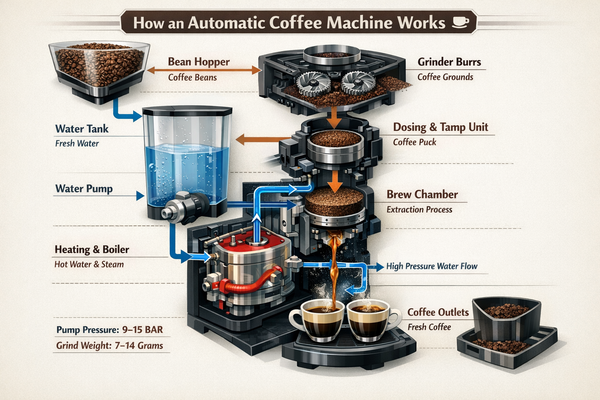

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/infographic_coffee_machine_h.png


In [ ]:
# 日本語訳: 自動コーヒーマシン（Jura など）の構造と流れを、豆の投入から挽き、計量、水タンク、ボイラーまで技術的かつ視覚的に理解できる詳細なインフォグラフィックを作成する。
prompt = """
Create a detailed Infographic of the functioning and flow of an automatic coffee machine like a Jura.
From bean basket, to grinding, to scale, water tank, boiler, etc.
I'd like to understand technically and visually the flow.
"""

infographics_sample_image_filename = "infographic_coffee_machine_h.png"   # @param {type:"string"}
image_size = "1536x1024" # @param ["1024x1024","1024x1536","1536x1024"]
image_quality = "high" # @param ["high","medium","low"]


result = client.images.generate(
    model="gpt-image-1.5",
    size = image_size,
    quality = image_quality,
    prompt=prompt
)

# colab で表示
display_result(result)
# drive へ出力
save_image(result, infographics_sample_image_filename)

![](../../images/infographic_coffee_machine.png)

## 4.2 Translation in Images

画像の翻訳は、既存のデザイン（広告、UI スクリーンショット、パッケージ、インフォグラフィックなど）を、レイアウトを一から作り直さずに別言語へローカライズするのに使われます。重要なのはテキスト以外のすべてを保持することです。タイポグラフィのスタイル、配置、行間・字間、情報の階層構造はそのままにしつつ、文字列だけを逐語的かつ正確に翻訳します。余計な語句を足さず、不要なレイアウト変更も避け、ロゴやアイコン、画像部分に意図しない編集を加えないようにします。


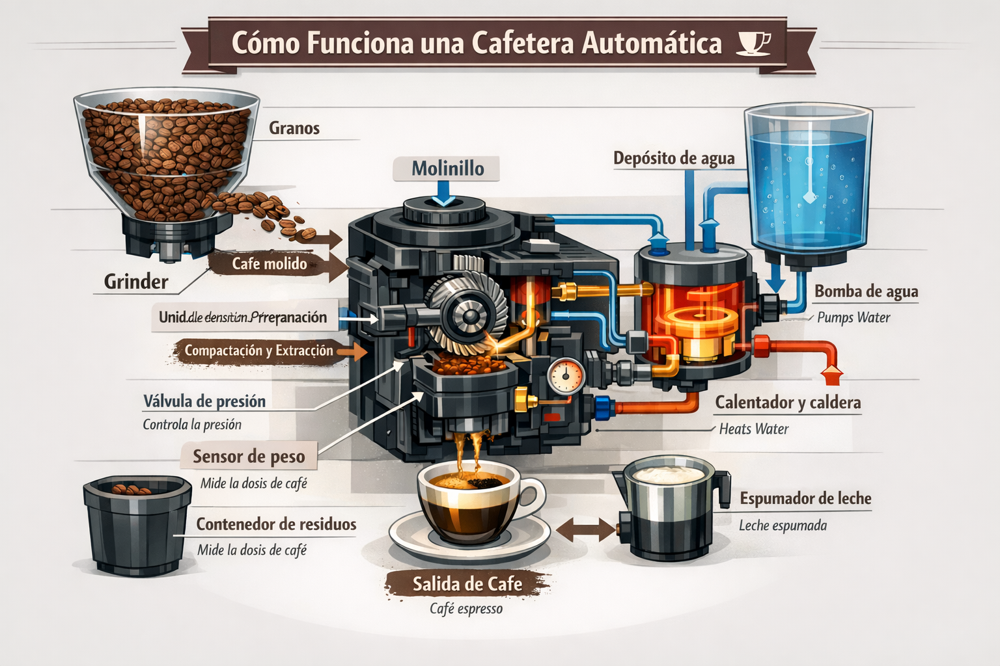

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/infographic_coffee_machine_es.png


In [ ]:
# 日本語訳: インフォグラフィック内のテキストをスペイン語に翻訳し、それ以外の画像要素は一切変更しない。
prompt = """
Translate the text in the infographic to Spanish. Do not change any other aspect of the image.
"""

input_image_filepath = os.path.join(OUTPUT_PATH, infographics_sample_image_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(input_image_filepath, "rb"),
    ],
    prompt=prompt
)

output_image_filename = add_or_change_language_suffix(input_image_filepath , "_es")

# colab で表示
display_result(result)
# drive へ保存
save_image(result, output_image_filename)

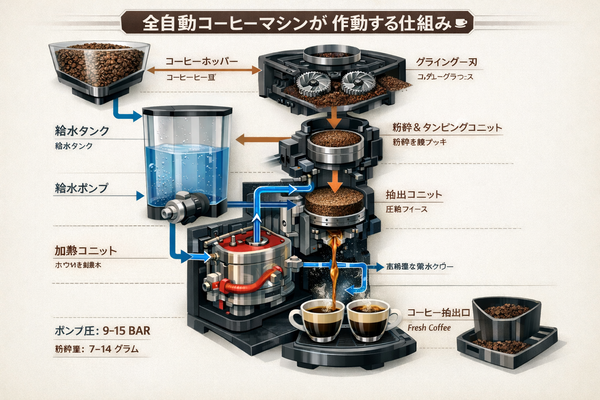

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/infographic_coffee_machine_h_ja.png


In [ ]:
# 日本語訳: インフォグラフィック内のテキストを日本語に翻訳し、それ以外の画像要素は一切変更しない。
prompt = """
Translate the text in the infographic to Japanese. Do not change any other aspect of the image.
"""

input_image_filepath = os.path.join(OUTPUT_PATH, infographics_sample_image_filename)
image_size = "1536x1024" # @param ["1024x1024","1024x1536","1536x1024"]
image_quality = "high" # @param ["high","medium","low"]

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(input_image_filepath, "rb"),
    ],
    size = image_size,
    quality = image_quality,
    prompt=prompt
)

output_image_filename = add_or_change_language_suffix(input_image_filepath , "_ja")

# colab で表示
display_result(result)
# drive へ保存
save_image(result, output_image_filename)

出力画像:

![](../../images/infographic_coffee_machine_sp.png)

## 4.3 Photorealistic Images that Feel “natural”

信じられるフォトリアリズムを得るには、「その瞬間を本物のカメラで撮影している」つもりでプロンプトを書くのが効果的です。写真用語（レンズ、ライティング、フレーミング）を用い、本物らしい質感（毛穴、しわ、布の擦り切れやヨレなど）を明示します。スタジオライティングや演出された印象を与える言葉は避けましょう。ディテールが重要な場合は、quality="high" を指定します。


In [ ]:
# 日本語訳: 小さな漁船の上に立つ年配の船乗りの、自然でフォトリアルなスナップ写真を作成する。
# 顔や腕にはしわや毛穴、日焼け跡や薄くなったタトゥーなどのディテールを入れ、犬と一緒に甲板で網を調整している様子を、35mm フィルム写真風の中距離ショットで撮る。
# 柔らかい海沿いの自然光、浅い被写界深度、さりげないフィルムグレイン、自然な色調で、過度に演出やレタッチをせず、リアルな質感と生活感を重視する。
prompt = """
Create a photorealistic candid photograph of an elderly sailor standing on a small fishing boat.
He has weathered skin with visible wrinkles, pores, and sun texture, and a few faded traditional sailor tattoos on his arms.
He is calmly adjusting a net while his dog sits nearby on the deck. Shot like a 35mm film photograph, medium close-up at eye level, using a 50mm lens.
Soft coastal daylight, shallow depth of field, subtle film grain, natural color balance.
The image should feel honest and unposed, with real skin texture, worn materials, and everyday detail. No glamorization, no heavy retouching.
"""
photorealism_sample_image_filename = "photorealism.png"   # @param {type:"string"}

result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt,
    quality="high"
)

save_image(result, photorealism_sample_image_filename)

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/photorealism.png


Output Image:

![](../../images/photorealism.png)

## 4.4 World knowledge

GPT-image-1.5 には組み込みの推論機能と強力な世界知識があります。たとえば、「1969 年 8 月のニューヨーク州ベセルのシーンを生成して」と依頼すると、Woodstock を推測し、イベント名を明示しなくても、正確で文脈に合った画像を生成できます。


In [ ]:
# 日本語訳: 1969 年 8 月 16 日、ニューヨーク州ベセルにおける屋外の群衆シーンを、時代考証に合った服装やステージング、環境でフォトリアルに描く。
prompt = """
Create a realistic outdoor crowd scene in Bethel, New York on August 16, 1969.
Photorealistic, period-accurate clothing, staging, and environment.
"""
world_knowledge_image_filename = "World_knowledge.png"   # @param {type:"string"}

result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt
)

save_image(result,world_knowledge_image_filename)

Output Image:

![](../../images/world_knowledge.png)

## 4.5 Logo Generation

強力なロゴ生成には、明確なブランド制約とシンプルさが重要です。ブランドの性格や用途を説明し、形状がはっきりして負のスペースのバランスがよく、大小さまざまなサイズで読める、クリーンでオリジナルなロゴマークを求めます。

生成したいバリエーション数を指定するには、"n" パラメータを使います。


In [ ]:
# 日本語訳: Field & Flour という地元のベーカリーのために、オリジナルかつ権利侵害のないロゴを作成する。
# ロゴは温かくシンプルで時代を超えた印象にし、クリーンなベクター風シェイプと強いシルエット、バランスの良い余白を用いる。
# 小さなサイズでも大きなサイズでも読みやすい、フラットデザインで、必要最小限の線とグラデーションにとどめ、プレーンな背景に余裕を持って中央配置し、ウォーターマークは入れない。
prompt = """
Create an original, non-infringing logo for a company called Field & Flour, a local bakery.
The logo should feel warm, simple, and timeless. Use clean, vector-like shapes, a strong silhouette, and balanced negative space.
Favor simplicity over detail so it reads clearly at small and large sizes. Flat design, minimal strokes, no gradients unless essential.
Plain background. Deliver a single centered logo with generous padding. No watermark.
"""


logo_image_base_filename = "samplelogo"   # @param {type:"string"}
logo_image_filename = add_or_change_language_suffix(logo_image_base_filename ,"_en" )

result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt,
    n=4     # Generate 4 versions of the logo
)

save_image_n(result ,logo_image_base_filename , "png")
# Save all 4 images to separate files
# for i, item in enumerate(result.data, start=1):
#     image_base64 = item.b64_json
#     image_bytes = base64.b64decode(image_base64)
#     with open(f"../../images/output_images/logo_generation_{i}.png", "wb") as f:
#         f.write(image_bytes)

Image 1 saved successfully to /content/drive/MyDrive/openai_example_images/output_images/samplelogo_1..png
Image 2 saved successfully to /content/drive/MyDrive/openai_example_images/output_images/samplelogo_2..png
Image 3 saved successfully to /content/drive/MyDrive/openai_example_images/output_images/samplelogo_3..png
Image 4 saved successfully to /content/drive/MyDrive/openai_example_images/output_images/samplelogo_4..png


## 4.6 Story-to-Comic Strip

ストーリーからコミックを生成する場合は、物語を明確な「視覚的な見せ場」の列として定義し、1 パネルにつき 1 つのビートにします。説明は具体的かつアクション中心にして、ストーリーが読みやすくテンポのよいパネル構成へと変換されるようにします。


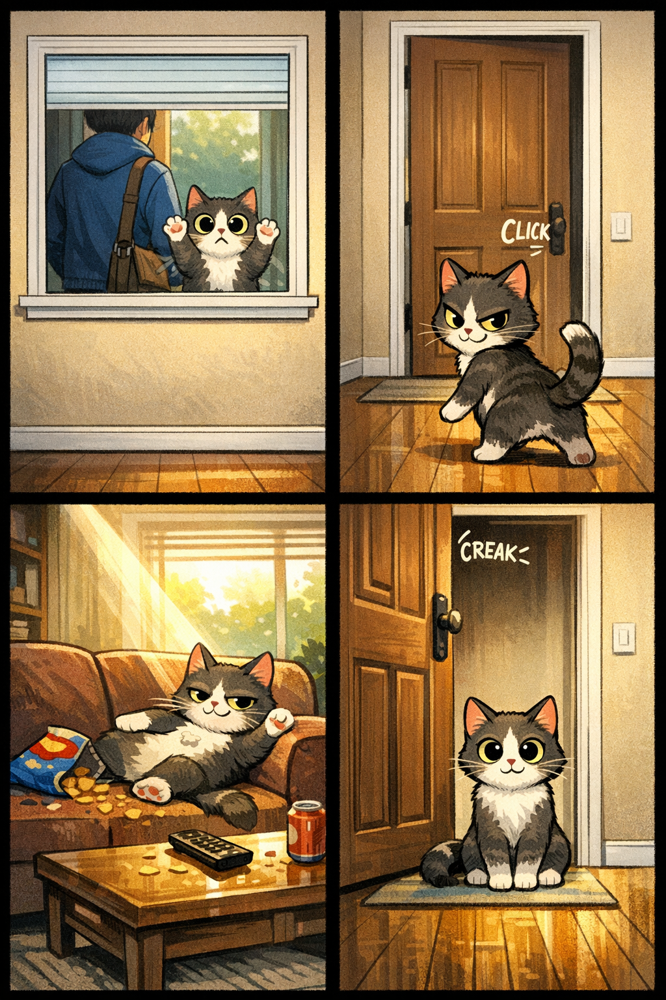

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/comic_reel.png


In [ ]:
# 日本語訳: 4 コマ構成の縦型コミック風リールを作成し、
# 1 コマ目では飼い主が家を出て行き、窓越しに小さく映るペットが静かな家を見つめる。
# 2 コマ目ではドアが閉まり静寂が破れ、ペットが空になった家へ向き直り期待に満ちた様子を見せる。
# 3 コマ目では家が一変し、ペットがソファを占拠しておやつの食べかすや差し込む光の中でくつろぐ。
# 4 コマ目ではドアが開き、何事もなかったかのように入口でお行儀よく座るペットを描く。
prompt = """
Create a short vertical comic-style reel with 4 equal-sized panels.
Panel 1: The owner leaves through the front door. The pet is framed in the window behind them, small against the glass, eyes wide, paws pressed high, the house suddenly quiet.
Panel 2: The door clicks shut. Silence breaks. The pet slowly turns toward the empty house, posture shifting, eyes sharp with possibility.
Panel 3: The house transformed. The pet sprawls across the couch like it owns the place, crumbs nearby, sunlight cutting across the room like a spotlight.
Panel 4: The door opens. The pet is seated perfectly by the entrance, alert and composed, as if nothing happened.
"""
comic_reel_filename = "comic_reel.png"   # @param {type:"string"}
result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt
)
# colab で表示
display_result(result)
save_image(result,comic_reel_filename)

出力画像:

![](../../images/comic-reel.png)

## 4.7 UI Mockups

UI モックは、「そのプロダクトがすでに実在している」かのように説明すると最も良い結果が出ます。レイアウト、情報の階層、余白、実際のインターフェース要素にフォーカスし、「コンセプトアート風」の言葉を避けることで、デザインスケッチではなく、実際に出荷された製品の UI に見える仕上がりになります。


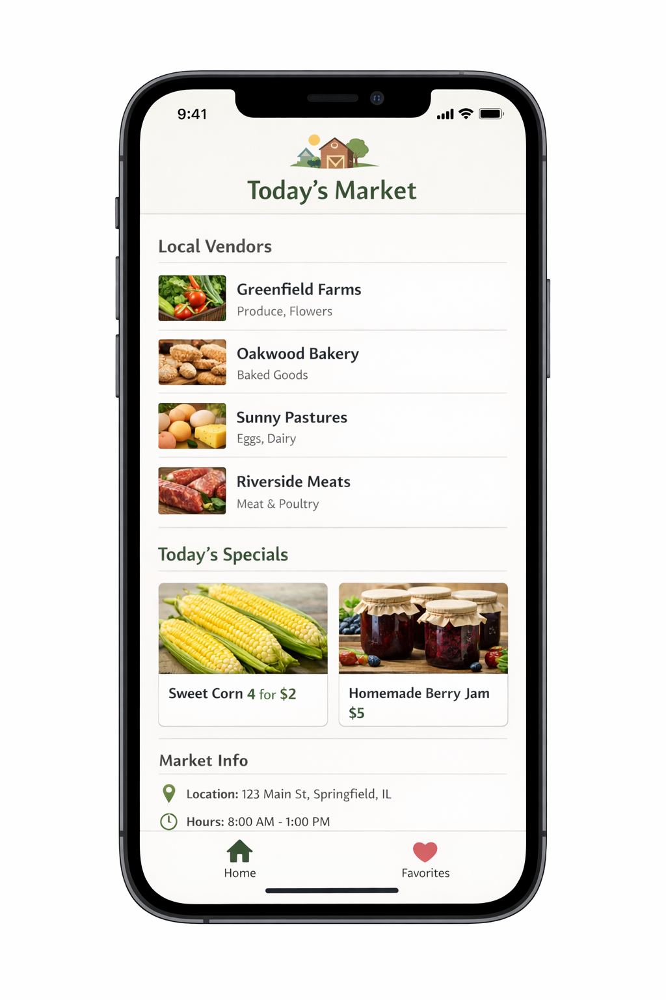

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/ui_farmers.png


In [ ]:
# 日本語訳: 地元のファーマーズマーケット向けの、実在しそうなモバイルアプリ UI モックを作成する。
# 当日のマーケット情報、出店者一覧と写真・カテゴリ、「今日のおすすめ」、場所と営業時間などを、実用的で使いやすいレイアウトで表示し、
# 白背景と自然なアクセントカラー、読みやすいタイポグラフィと最小限の装飾で、小さなマーケット向けの美しい本物のアプリのように見せ、iPhone フレーム内に配置する。
prompt = """
Create a realistic mobile app UI mockup for a local farmers market.
Show today’s market with a simple header, a short list of vendors with small photos and categories, a small “Today’s specials” section, and basic information for location and hours.
Design it to be practical, and easy to use. White background, subtle natural accent colors, clear typography, and minimal decoration.
It should look like a real, well-designed, beautiful app for a small local market.
Place the UI mockup in an iPhone frame.
"""
ui_farmers_filename = "ui_farmers.png"   # @param {type:"string"}
result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt
)

# colab で表示
display_result(result)
save_image(result, ui_farmers_filename)

Output Image:

![](../../images/ui_farmers_market.png)

## 5. Use cases — Edit (text + image → image)

## 5.1 Style Transfer

スタイル転写は、参照画像の *ビジュアル言語*（色調、質感、筆致、フィルムグレインなど）を保ったまま、被写体やシーンを変えたいときに有用です。最良の結果を得るには、何を一貫させる必要があるか（スタイルの手がかり）と、何を変えたいか（新しい内容）を明確に分けて記述し、背景、フレーミング、「余計な要素を追加しない」といったハードな制約を加えることで、スタイルが不必要に変化してしまうのを防ぎます。


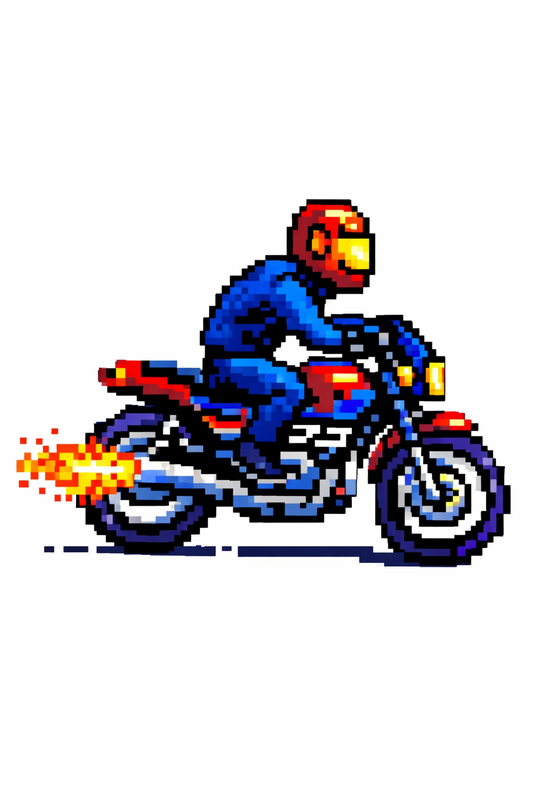

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/motorcycle.png


In [ ]:
# 日本語訳: 入力画像と同じスタイルを維持したまま、白い背景上でバイクに乗る男性の画像を生成する。
prompt = """
Use the same style from the input image and generate a man riding a motorcycle on a white background.
"""

input_image_filename = "pixels.png"   # @param {type:"string"}
input_image_filepath = os.path.join(INPUT_PATH, input_image_filename)

output_image_filename = "motorcycle.png"   # @param {type:"string"}

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(input_image_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_result(result)

save_image(result, output_image_filename)

入力画像:

![](../../images/pixels.png)

Output Image:

![](../../images/motorcycle.png)

## 5.2 Virtual Clothing Try-On


バーチャル試着は、EC サイトのプレビューなどで、人物のアイデンティティを厳密に守りたい場合に適しています。重要なのは、「人物」を明示的にロックすることです（顔、体型、ポーズ、髪型、表情）。変更を *衣服のみに* 限定し、既存のポーズと身体の形状に沿った、現実的なフィット感（ドレープ、シワ、隠れ・重なり）を求めます。ライティングや影も元画像と一貫させて、服だけが不自然に貼り付けられているように見えないようにします。


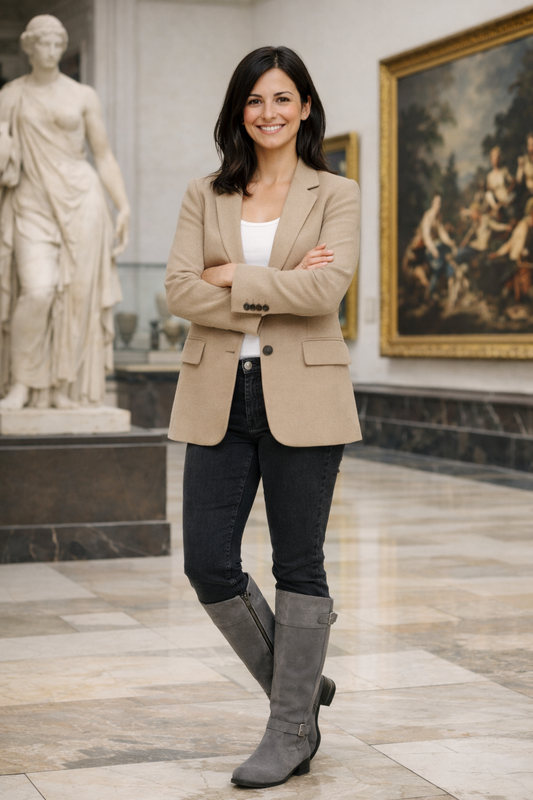

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/outfit.png


In [ ]:
# 日本語訳: 女性の顔や肌の色、体型、ポーズ、表情、髪型、アイデンティティは一切変えず、与えられた服の画像だけを使って自然に着せ替える。
# 服は元のポーズと体の形状に沿うようリアルにフィットさせ、照明や影、色温度を元写真に合わせてフォトリアルに統合し、背景やカメラアングル、フレーミング、画質、余計なアクセサリやテキスト、ロゴ、ウォーターマークは追加しない。
prompt = """
Edit the image to dress the woman using the provided clothing images. Do not change her face, facial features, skin tone, body shape, pose, or identity in any way. Preserve her exact likeness, expression, hairstyle, and proportions. Replace only the clothing, fitting the garments naturally to her existing pose and body geometry with realistic fabric behavior. Match lighting, shadows, and color temperature to the original photo so the outfit integrates photorealistically, without looking pasted on. Do not change the background, camera angle, framing, or image quality, and do not add accessories, text, logos, or watermarks.
"""

person_image_filename = "woman_in_museum.png" # @param {type:"string"}
tank_top_image_filename = "tank_top.png" # @param {type:"string"}
jacket_image_filename = "jacket.png" # @param {type:"string"}
boots_image_filename = "boots.png" # @param {type:"string"}
output_outfit_image_filename = "outfit.png" # @param {type:"string"}

person_image_filepath = os.path.join(INPUT_PATH, person_image_filename)
tank_top_image_filepath = os.path.join(INPUT_PATH, tank_top_image_filename)
jacket_image_filepath = os.path.join(INPUT_PATH, jacket_image_filename)
boots_image_filepath = os.path.join(INPUT_PATH, boots_image_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(person_image_filepath, "rb"),
        open(tank_top_image_filepath, "rb"),
        open(jacket_image_filepath, "rb"),
        open(tank_top_image_filepath, "rb"), # This seems like a duplicate, might be intentional for example
        open(boots_image_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_result(result)

save_image(result, output_outfit_image_filename)

## 5.3 Drawing → Image (Rendering)


Sketch-to-render のワークフローは、ラフなドローイングを、元の意図を保ったままフォトリアルなコンセプトに変換するのに最適です。プロンプトは仕様書のように扱います。レイアウトやパースは保持しつつ、現実的なマテリアル、ライティング、環境を指定して「リアリズムを追加」します。モデルが勝手に解釈を広げないよう、「新しい要素やテキストを追加しない」と明記しましょう。


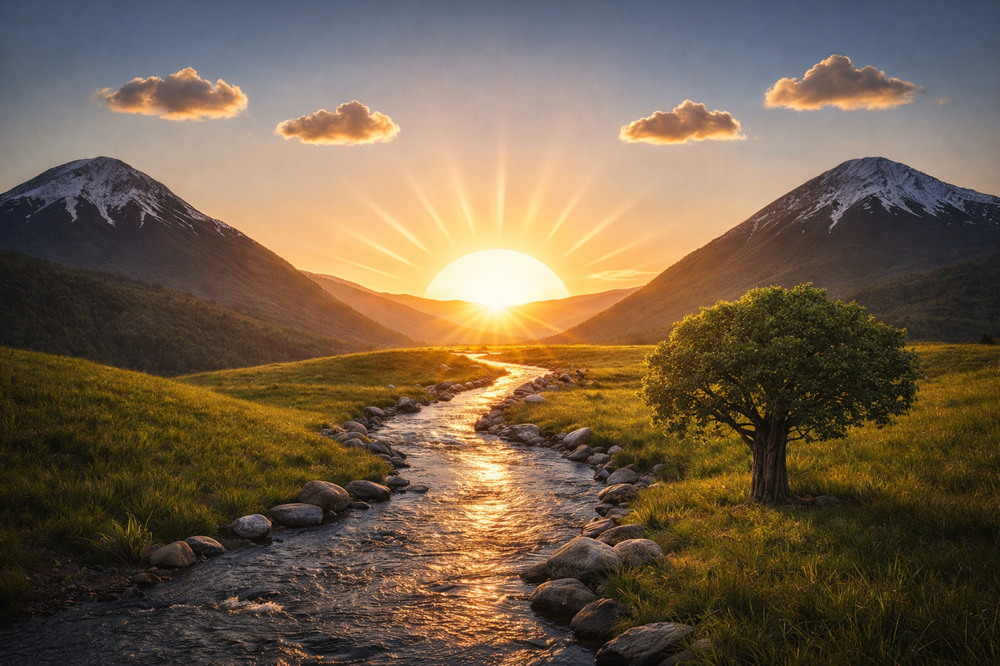

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/realistic_valley.png


In [ ]:
prompt = """
Turn this drawing into a photorealistic image.
Preserve the exact layout, proportions, and perspective.
Choose realistic materials and lighting consistent with the sketch intent.
Do not add new elements or text.
"""

input_drawing_filename = "drawings.png"   # @param {type:"string"}
output_image_filename = "realistic_valley.png"   # @param {type:"string"}

input_drawing_filepath = os.path.join(INPUT_PATH, input_drawing_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(input_drawing_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_result(result)

save_image(result, output_image_filename)

## 5.4 Product Mockups (transparent background + label integrity)

商品切り抜きとモックアップの準備は、カタログ、マーケットプレイス、デザインシステムなどでよく使われます。成功の鍵は、エッジの品質（輪郭がきれいで、にじみやハロがないこと）とラベルの保全性（文字がシャープで変更されないこと）です。リアリズムは欲しいがスタイルは変えたくない場合、「ほんの少しの磨き」と、アルファチャンネルに沿ったさりげない接地影のみを要求し、商品自体の雰囲気を変えないようにします。


商品切り抜きとモックアップの準備は、カタログ、マーケットプレイス、デザインシステムなどでよく使われます。成功の鍵は、エッジの品質（輪郭がきれいで、にじみやハロがないこと）とラベルの保全性（文字がシャープで変更されないこと）です。リアリズムは欲しいがスタイルは変えたくない場合、「ほんの少しの磨き」と、アルファチャンネルに沿ったさりげない接地影のみを要求し、商品自体の雰囲気を変えないようにします。


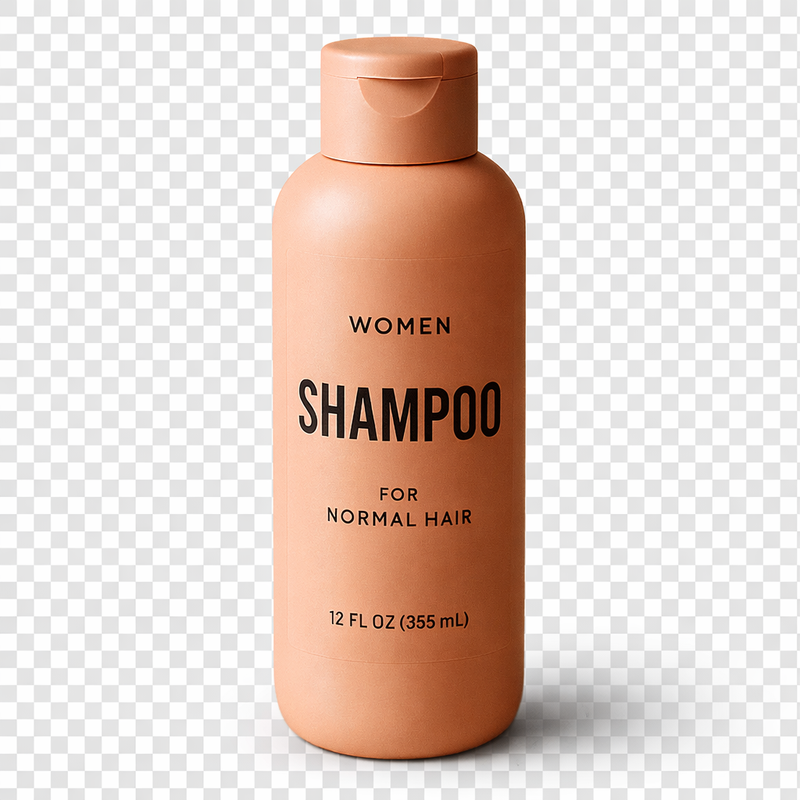

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/extract_product.png


In [ ]:
prompt = """
Extract the product from the input image.
Output: transparent background (RGBA PNG), crisp silhouette, no halos/fringing.
Preserve product geometry and label legibility exactly.
Optional: subtle, realistic contact shadow in the alpha (no hard cut line).
Do not restyle the product; only remove background and lightly polish.
"""

input_shampoo_filename = "shampoo.png" # @param {type:"string"}
output_extracted_product_filename = "extract_product.png" # @param {type:"string"}

input_shampoo_filepath = os.path.join(INPUT_PATH, input_shampoo_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(input_shampoo_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_from_file(input_shampoo_filepath)
display_result(result)

save_image(result, output_extracted_product_filename)

Input Image:

![](../../images/shampoo.png)

出力画像:

![](../../images/extract_product.png)

## 5.5 Marketing Creatives with Real Text In-Image

画像内に実際のテキストを含むマーケティングクリエイティブは、広告コンセプトを高速に試すのに非常に有効ですが、タイポグラフィには明示的な制約が必要です。コピーは正確な文面を引用符で囲んで指定し、余計な文字を足さないよう厳密なレンダリングを要求し、配置やフォントスタイルも記述します。文字の再現性が十分でない場合は、プロンプトを厳格に保ったまま、文言やレイアウトを少しずつ調整してイテレーションすると、可読性が改善されることが多いです。


画像内に実際のテキストを含むマーケティングクリエイティブは、広告コンセプトを高速に試すのに非常に有効ですが、タイポグラフィには明示的な制約が必要です。コピーは正確な文面を引用符で囲んで指定し、余計な文字を足さないよう厳密なレンダリングを要求し、配置やフォントスタイルも記述します。文字の再現性が十分でない場合は、プロンプトを厳格に保ったまま、文言やレイアウトを少しずつ調整してイテレーションすると、可読性が改善されることが多いです。


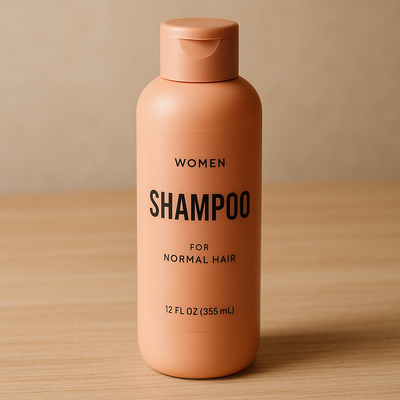

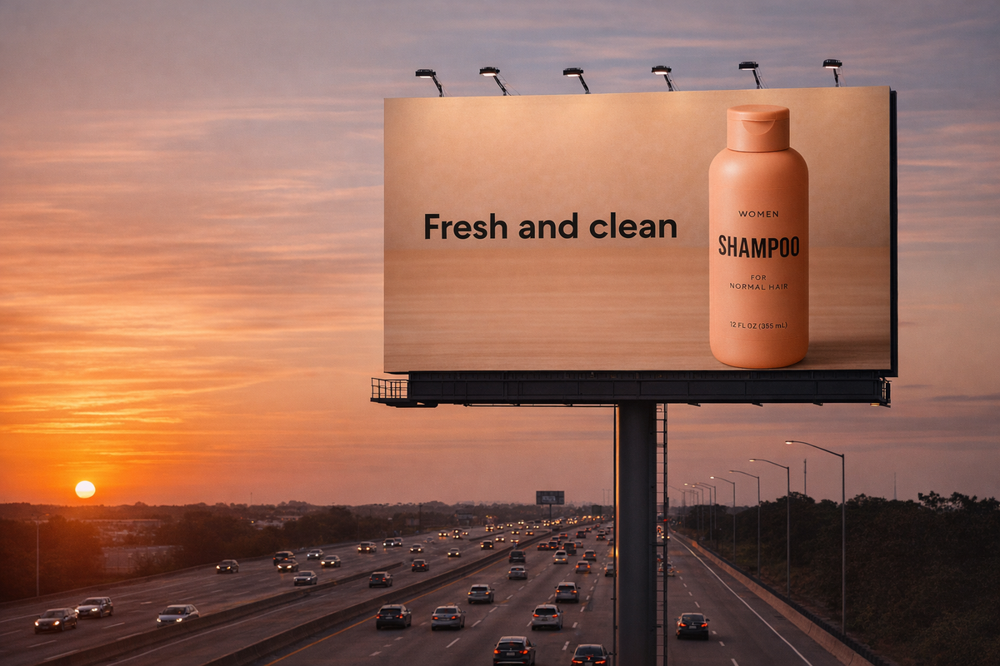

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/billboard.png


In [ ]:
prompt = """
Create a realistic billboard mockup of the shampoo on a highway scene during sunset.
Billboard text (EXACT, verbatim, no extra characters):
"Fresh and clean"
Typography: bold sans-serif, high contrast, centered, clean kerning.
Ensure text appears once and is perfectly legible.
No watermarks, no logos.
"""

input_shampoo_filename = "shampoo.png" # @param {type:"string"}
output_billboard_filename = "billboard.png" # @param {type:"string"}

input_shampoo_filepath = os.path.join(INPUT_PATH, input_shampoo_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(input_shampoo_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_from_file(input_shampoo_filepath)
display_result(result)

save_image(result, output_billboard_filename)

入力画像:

![](../../images/shampoo.png)

Output Image:

![](../../images/billboard.png)

## 5.6 Lighting and Weather Transformation

このユースケースは、同じシーンを、異なるムード・季節・時間帯のバリアントとして作り直したいとき（例：晴天 → 曇り、昼 → 夕暮れ、晴れ → 雪景色など）に使われます。ポイントは、シーン構成を保ったまま環境条件だけを変えることです。ライティングの向き・質、影、空気感、降水、地面の濡れ具合などを変化させる一方で、アイデンティティ、ジオメトリ、カメラアングル、物体の配置は維持し、「同じ写真だと認識できる」状態に保ちます。


このユースケースは、同じシーンを、異なるムード・季節・時間帯のバリアントとして作り直したいとき（例：晴天 → 曇り、昼 → 夕暮れ、晴れ → 雪景色など）に使われます。ポイントは、シーン構成を保ったまま環境条件だけを変えることです。ライティングの向き・質、影、空気感、降水、地面の濡れ具合などを変化させる一方で、アイデンティティ、ジオメトリ、カメラアングル、物体の配置は維持し、「同じ写真だと認識できる」状態に保ちます。


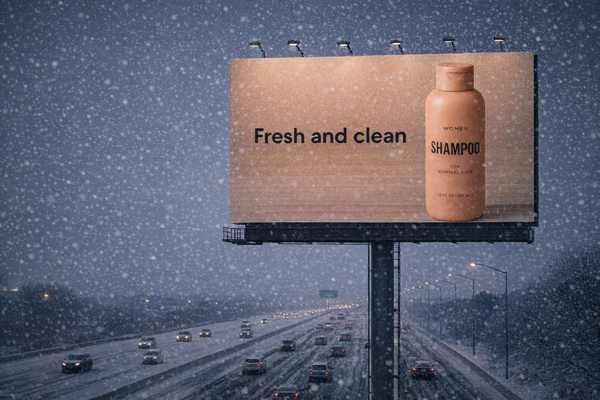

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/billboard_winter.png


In [ ]:
prompt = """
Make it look like a winter evening with snowfall.
"""

input_billboard_filename = "billboard.png" # @param {type:"string"}
output_winter_billboard_filename = "billboard_winter.png" # @param {type:"string"}

input_billboard_filepath = os.path.join(OUTPUT_PATH, input_billboard_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    input_fidelity="high",
    quality="high",
    image=[
        open(input_billboard_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_result(result)

save_image(result, output_winter_billboard_filename)

Output Image:

![](../../images/billboard_winter.png)

## 5.7 Object Removal

オブジェクト除去は、ストーリーボードやキャンペーン、「もしこうだったら？」というシナリオで、シーンの一部だけを自然に消したい場合に便利です。特に人物が写っている場合は、顔やアイデンティティを守ることが重要です。自然な写真表現（自然光、信頼できるディテール、過度なカラーグレーディングなし）を指定し、変更してよい範囲と変えてはいけない範囲をロックします。大きな編集を行うときは、input_fidelity を高く設定することで、元の人物の面影をより確実に維持できます。


オブジェクト除去は、ストーリーボードやキャンペーン、「もしこうだったら？」というシナリオで、シーンの一部だけを自然に消したい場合に便利です。特に人物が写っている場合は、顔やアイデンティティを守ることが重要です。自然な写真表現（自然光、信頼できるディテール、過度なカラーグレーディングなし）を指定し、変更してよい範囲と変えてはいけない範囲をロックします。大きな編集を行うときは、input_fidelity を高く設定することで、元の人物の面影をより確実に維持できます。


Input Image:


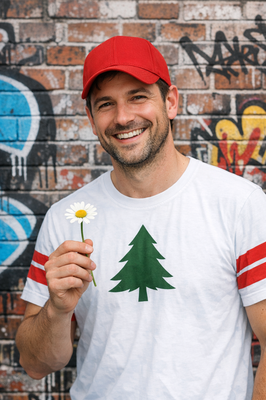


Output Image 1:


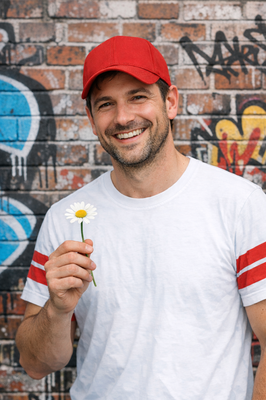

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/man_with_no_tree_logo.png

Output Image 2:


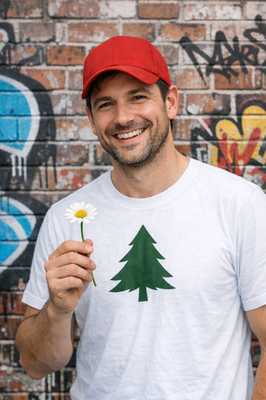

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/man_with_no_red_stripes.png

Output Image 3:


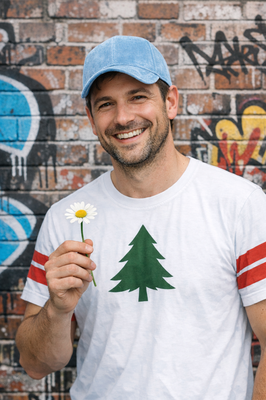

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/man_with_light_blue_hat.png


In [ ]:
prompts = [
    "Remove the tree logo from the white t-shirt of the man. Do not change anything else.",
    "Remove the red stripes from the white t-shirt of the man. Do not change anything else.",
    "Change the color of thered hat to light blue as velvet. Do not change anything else."
]

output_filenames = [
    "man_with_no_tree_logo.png",
    "man_with_no_red_stripes.png",
    "man_with_light_blue_hat.png"
]

input_image_filename = "man_with_flower.png" # @param {type:"string"}
input_image_filepath = os.path.join(INPUT_PATH, input_image_filename)

# Display the original input image
print("Input Image:")
display_from_file(input_image_filepath)

# Generate and display images for each prompt
for i, prompt_text in enumerate(prompts):
    print(f"\nOutput Image {i+1}:")
    result = client.images.edit(
        model="gpt-image-1.5",
        input_fidelity="high",
        quality="high",
        image=[
            open(input_image_filepath, "rb"),
        ],
        prompt=prompt_text
    )

    display_result(result)
    save_image(result, output_filenames[i])

| Original Input | Remove Red Stripes | Change Hat Color |
|:------------:|:--------------:|:--------------:|
| ![](../../images/man_with_flower.png)  | ![](../../images/man_with_flower_no_stripes.png) |  ![](../../images/man_with_blue_hat.png) |

## 5.8 Insert the Person Into a Scene

人物合成（Person-in-scene compositing）は、ストーリーボードやキャンペーン、「もしこの人がこの場所にいたら？」といったシナリオで、顔やアイデンティティを保ったまま別シーンへ人物を挿入したいときに役立ちます。自然な写真表現（自然光、リアルなディテール、シネマティックすぎないカラーグレーディング）を指定してリアリズムを担保し、被写体について「変えてはいけない点」をロックします。大きなシーン編集を行う場合は、input_fidelity を高く設定すると、人物の顔立ちや雰囲気の一貫性が保たれやすくなります。


オブジェクト除去は、ストーリーボードやキャンペーン、「もしこうだったら？」というシナリオで、シーンの一部だけを自然に消したい場合に便利です。特に人物が写っている場合は、顔やアイデンティティを守ることが重要です。自然な写真表現（自然光、信頼できるディテール、過度なカラーグレーディングなし）を指定し、変更してよい範囲と変えてはいけない範囲をロックします。大きな編集を行うときは、input_fidelity を高く設定することで、元の人物の面影をより確実に維持できます。


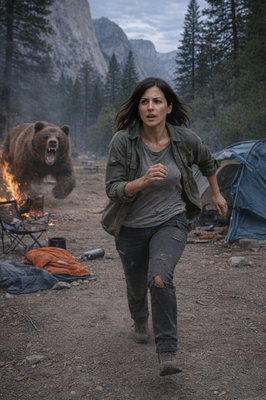

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/scene.png


In [ ]:
prompt = """
Generate a highly realistic action scene where this person is running away from a large, realistic brown bear attacking a campsite. The image should look like a real photograph someone could have taken, not an overly enhanced or cinematic movie-poster image.
She is centered in the image but looking away from the camera, wearing outdoorsy camping attire, with dirt on her face and tears in her clothing. She is clearly afraid but focused on escaping, running away from the bear as it destroys the campsite behind her.
The campsite is in Yosemite National Park, with believable natural details. The time of day is dusk, with natural lighting and realistic colors. Everything should feel grounded, authentic, and unstyled, as if captured in a real moment. Avoid cinematic lighting, dramatic color grading, or stylized composition.
"""

input_person_filename = "woman_in_museum.png" # @param {type:"string"}
output_scene_filename = "scene.png" # @param {type:"string"}

input_person_filepath = os.path.join(INPUT_PATH, input_person_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    input_fidelity="high",
    quality="high",
    image=[
        open(input_person_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_result(result)

save_image(result, output_scene_filename)

## 5.9 Multi-Image Referencing and Compositing


複数の入力から要素を 1 枚の自然な画像にまとめるユースケースに適しています。特に、「このオブジェクト／人物をあのシーンに挿入したい」といったワークフローで、すべてを再生成せずに合成したいときに有効です。重要なのは、何を移植するのか（例：画像 2 の犬）、どこに配置するのか（例：画像 1 の女性のすぐ隣）、そして何を変更してはいけないのか（シーン、背景、フレーミング）を明確に指定することです。そのうえで、ライティング、パース、スケール、影を一致させ、合成結果が元の写真の一部として自然に見えるようにします。


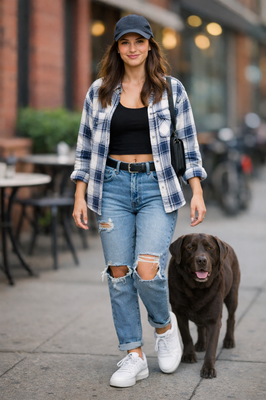

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/test_woman_with_dog.png


In [ ]:
prompt = """
Place the dog from the second image into the setting of image 1, right next to the woman, use the same style of lighting, composition and background. Do not change anything else.
"""

input_image1_filename = "test_woman.png" # @param {type:"string"}
input_image2_filename = "test_woman_2.png" # @param {type:"string"}
output_composite_filename = "test_woman_with_dog.png" # @param {type:"string"}

input_image1_filepath = os.path.join(INPUT_PATH, input_image1_filename)
input_image2_filepath = os.path.join(INPUT_PATH, input_image2_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    input_fidelity="high",
    quality="high",
    image=[
        open(input_image1_filepath, "rb"),
        open(input_image2_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_result(result)

save_image(result, output_composite_filename)

## 6. Additional High-Value Use Cases

## 6.1 Interior design “swap” (precision edits)
インテリアデザインの「差し替え」ワークフローは、シーン全体を再レンダリングせずに、実在する空間で家具や装飾の変更を視覚化したいときに便利です。目指すのは外科手術のような精密さで、カメラアングル、ライティング、影、周辺のコンテキストはそのままに、特定のオブジェクトだけを差し替えます。結果は「写真を撮り直したように見えること」が理想で、空間全体が別の部屋に見えてしまわないようにします。


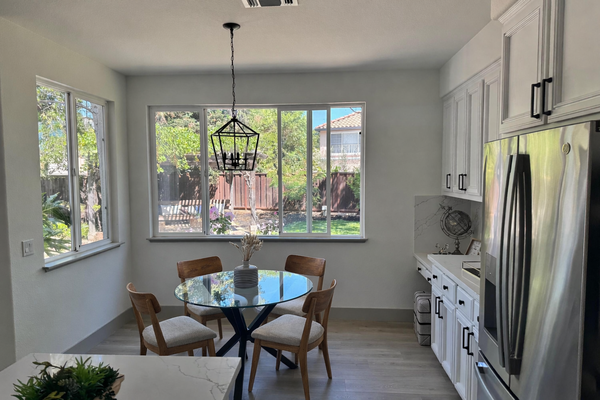

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/kitchen-chairs.png


In [ ]:
# 日本語訳: 部屋の写真で、白い椅子だけを木製の椅子に差し替え、カメラアングルや部屋のライティング、床の影、周囲のオブジェクトはそのまま保つ。
# その他の要素は一切変えず、フォトリアルな接地影や質感を維持する。
prompt = """
In this room photo, replace ONLY white with chairs made of wood.
Preserve camera angle, room lighting, floor shadows, and surrounding objects.
Keep all other aspects of the image unchanged.
Photorealistic contact shadows and fabric texture.
"""

input_image_filename = "kitchen.jpeg" # @param {type:"string"}
output_image_filename = "kitchen-chairs.png" # @param {type:"string"}

input_image_filepath = os.path.join(INPUT_PATH, input_image_filename)

result = client.images.edit(
    model="gpt-image-1.5",
    image=[
        open(input_image_filepath, "rb"),
    ],
    prompt=prompt
)

# colab で表示
display_result(result)

save_image(result, output_image_filename)

| Input Image | Output Image |
|------------|--------------|
| ![](../../images/kitchen.jpeg) | ![](../../images/kitchen-chairs.png) |

## 6.2 3D pop-up holiday card (product-style mock)
このユースケースは、季節キャンペーン用のマーケティングコンセプトや印刷プレビューに最適です。物理的なプロダクトの写真のように見せることを重視し、紙の層や繊維、折り目、柔らかなスタジオライティングといった「触感」を強調します。結果として、フラットなイラストではなく、「立体的なカードを撮影した」ような見た目になります。


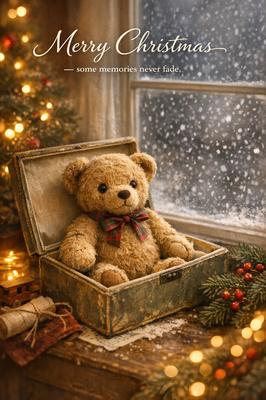

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/christmas_holiday_card_teddy.png


In [ ]:
scene_description = (
    "a cozy Christmas scene with an old teddy bear sitting inside a keepsake box, "
    "slightly worn fur, soft stitching repairs, placed near a window with falling snow outside. "
    "The scene suggests the child has grown up, but the memories remain."
)

short_copy = "Merry Christmas — some memories never fade."# @param {type:"string"}

# 日本語訳: 古いテディベアが記念ボックスの中に座り、外では雪が降るクリスマスの情景を用いて、
# 温かくノスタルジックで感情的な雰囲気のホリデーカード用ビジュアルを作成し、
# プレミアムなカード写真風のライティングや質感で仕上げ、「Merry Christmas — some memories never fade.」というテキストだけをそのままカード上に入れる。
prompt = f"""
Create a Christmas holiday card illustration.

Scene:
{scene_description}

Mood:
Warm, nostalgic, gentle, emotional.

Style:
Premium holiday card photography, soft cinematic lighting,
realistic textures, shallow depth of field,
tasteful bokeh lights, high print-quality composition.

Constraints:
- Original artwork only
- No trademarks
- No watermarks
- No logos

Include ONLY this card text (verbatim):
"{short_copy}"
"""
output_image_filename = "christmas_holiday_card_teddy.png" # @param {type:"string"}

result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt,
)
# colab で表示
display_result(result)

save_image(result,output_image_filename)

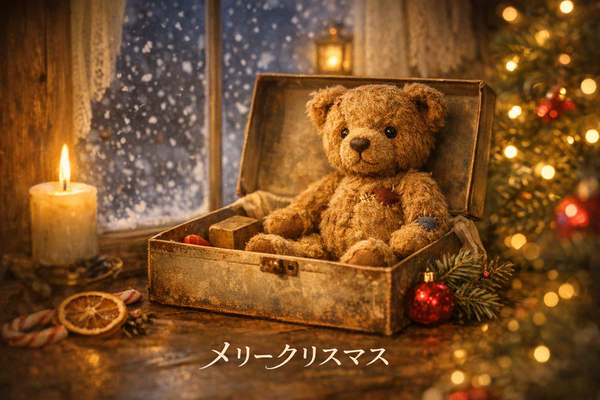

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/christmas_holiday_card_teddy_j.png


In [ ]:
scene_description = (
    "a cozy Christmas scene with an old teddy bear sitting inside a keepsake box, "
    "slightly worn fur, soft stitching repairs, placed near a window with falling snow outside. "
    "The scene suggests the child has grown up, but the memories remain."
)

short_copy = "メリークリスマス"# @param {type:"string"}

# 日本語訳: 古いテディベアが記念ボックスの中に座り、外では雪が降るクリスマスの情景を用いて、
# 温かくノスタルジックで感情的な雰囲気のホリデーカード用ビジュアルを作成し、
# プレミアムなカード写真風のライティングや質感で仕上げ、「Merry Christmas — some memories never fade.」というテキストだけをそのままカード上に入れる。
prompt = f"""
Create a Christmas holiday card illustration.

Scene:
{scene_description}

Mood:
Warm, nostalgic, gentle, emotional.

Style:
Premium holiday card photography, soft cinematic lighting,
realistic textures, shallow depth of field,
tasteful bokeh lights, high print-quality composition.

Constraints:
- Original artwork only
- No trademarks
- No watermarks
- No logos

Include ONLY this card text (verbatim):
"{short_copy}"
"""
output_image_filename = "christmas_holiday_card_teddy_j.png" # @param {type:"string"}
image_size = "1536x1024" # @param ["1024x1024","1024x1536","1536x1024"]
image_quality = "high" # @param ["high","medium","low"]

result = client.images.generate(
    model="gpt-image-1.5",
    size=image_size,
    quality = image_quality,
    prompt=prompt,
)
# colab で表示
display_result(result)

save_image(result,output_image_filename)

## 6.3 Collectible Action Figure / Plush Keychain (merch concept)

このユースケースは、グッズの初期アイデア出しや提案用ビジュアルに向いています。マテリアル、パッケージ、印刷のシャープさといったプレミアムなプロダクトフォトの要素を重視しつつ、デザインはオリジナルで非侵害的なものに保ちます。キャラクターやパッケージのバリエーションを素早く複数試す用途にも適しています。


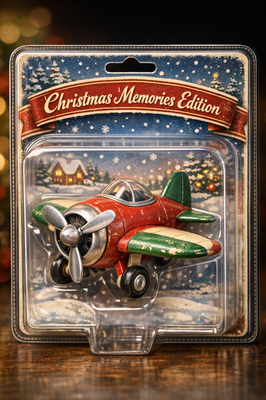

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/christmas_collectible_toy_airplane.png


In [ ]:
# ---- Inputs ----
character_description = (
    "a vintage-style toy propeller airplane with rounded wings, "
    "a front-mounted spinning propeller, slightly worn paint edges, "
    "classic childhood proportions, designed as a nostalgic holiday collectible"
)

short_copy = "Christmas Memories Edition"# @param {type:"string"}

# ---- Prompt ----
# 日本語訳: 丸みのある翼とプロペラを持つヴィンテージ調のおもちゃ飛行機を題材に、ブリスターパッケージ入りのコレクタブルフィギュアを作成する。
# 冬のホリデーシーズンに子どもが遊んでいたシンプルなおもちゃ飛行機を思わせる、温かく想像力をかき立てるノスタルジックなコンセプトで、
# 高品質な商品写真風のスタイルとリアルなマテリアル表現を用い、「Christmas Memories Edition」というテキストだけをそのままパッケージに入れる。
prompt = f"""
Create a collectible action figure of {character_description}, in blister packaging.

Concept:
A nostalgic holiday collectible inspired by the simple toy airplanes
children used to play with during winter holidays.
Evokes warmth, imagination, and childhood wonder.

Style:
Premium toy photography, realistic plastic and painted metal textures,
studio lighting, shallow depth of field,
sharp label printing, high-end retail presentation.

Constraints:
- Original design only
- No trademarks
- No watermarks
- No logos

Include ONLY this packaging text (verbatim):
"{short_copy}"
"""

result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt,
)

output_illustration_filename = "christmas_collectible_toy_airplane.png" # @param {type:"string"}
# colab で表示
display_result(result)
save_image(result, output_illustration_filename)

出力画像:

![](../../images/christmas_collectible_toy_airplane.png)

## 6.4 Children’s Book Art with Character Consistency (multi-image workflow)
これは、キャラクターの一貫性が不可欠なマルチページのイラスト制作パイプライン向けに設計されています。再利用可能な「キャラクターアンカー」によって、シーンやポーズ、ページが変わっても、環境やストーリーは変化させつつキャラクターの見た目を安定させることができます。


1️⃣ Character Anchor — establish the reusable main character

目標：キャラクターの外見、プロポーション、衣装、トーンをロックし、以降のページで再利用可能なメインキャラクターを確立します。


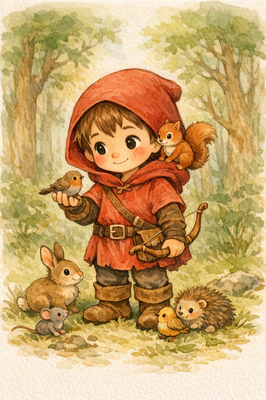

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/childrens_book_illustration_1.png


In [ ]:
# ---- Inputs ----
# 日本語訳: 小さな森の無法者をイメージした若い主人公が登場する、児童書風のイラストを作成する。
# 緑のフード付きチュニックと茶色のブーツ、ポーチを身につけた、優しく勇敢な表情のキャラクターが、リスや鳥、ウサギなどの小動物を守り助けるテーマで、
# 水彩画風のやわらかいタッチと暖かい色合い、絵本向きの少し大きめの頭身で、オリジナルキャラクターかつテキストやウォーターマークなし、森の背景でキャラクターをはっきり見せる。
prompt = """
Create a children’s book illustration introducing a main character.

Character:
A young, storybook-style hero inspired by a little forest outlaw,
wearing a simple red hooded tunic, soft brown boots, and a small belt pouch.
The character has a kind expression, gentle eyes, and a brave but warm demeanor.
Carries a small wooden bow used only for helping, never harming.

Theme:
The character protects and rescues small forest animals like squirrels, birds, and rabbits.

Style:
Children’s book illustration, hand-painted watercolor look,
soft outlines, warm earthy colors, whimsical and friendly.
Proportions suitable for picture books (slightly oversized head, expressive face).

Constraints:
- Original character (no copyrighted characters)
- No text
- No watermarks
- Plain forest background to clearly showcase the character
"""

# ---- Image generation ----
result = client.images.generate(
    model="gpt-image-1.5",
    prompt=prompt,
)
output_illustration_filename = "childrens_book_illustration_1.png" # @param {type:"string"}
display_result(result)
save_image(result,output_illustration_filename)

2️⃣ Story continuation — reuse character, advance the narrative

目標：同じキャラクターを保ったまま、新しいシーンとアクションで物語を進めること。キャラクターの見た目は変更してはいけません。


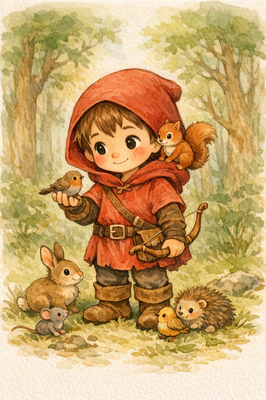

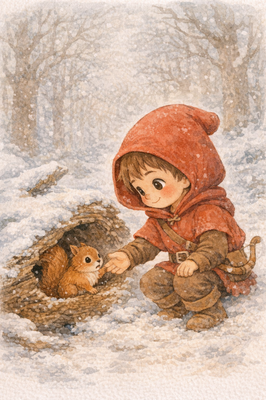

Image saved successfully to /content/drive/MyDrive/openai_example_images/output_images/childrens_book_illustration_2.png


In [ ]:
# ---- Inputs ----
# 日本語訳: 前のステップと同じキャラクターを使って児童書の物語を続け、
# 冬の嵐で倒れた木から怯えたリスを助け出すシーンを描く。
# キャラクターの服装や顔立ち、色使い、性格は変えず、水彩画風の雪の森の中で、安心させるようにリスに寄り添う温かい雰囲気を表現する。
prompt = """
Continue the children’s book story using the same character.

Scene:
The same young forest hero is gently helping a frightened squirrel
out of a fallen tree after a winter storm.
The character kneels beside the squirrel, offering reassurance.

Character Consistency:
- Same red hooded tunic
- Same facial features, proportions, and color palette
- Same gentle, heroic personality

Style:
Children’s book watercolor illustration,
soft lighting, snowy forest environment,
warm and comforting mood.

Constraints:
- Do not redesign the character
- No text
- No watermarks
"""

input_illustration_filename = "childrens_book_illustration_1.png" # @param {type:"string"}
output_illustration_filename = "childrens_book_illustration_2.png" # @param {type:"string"}

input_illustration_filepath = os.path.join(OUTPUT_PATH, input_illustration_filename)

# ファイルが存在しない場合は処理を停止する
if not os.path.exists(input_illustration_filepath):
    print(f"Error: Input image file not found at {input_illustration_filepath}")
else:
    # ---- Image generation ----
    result = client.images.edit(
        model="gpt-image-1.5",
        image=[
            open(input_illustration_filepath, "rb"),  # ← use image from step 1
        ],
        prompt=prompt,
    )

    # colab で表示
    display_from_file(input_illustration_filepath)
    display_result(result)

    save_image(result, output_illustration_filename)


出力画像:

![](../../images/childrens_book_illustration_2.png)

## Conclusion

このノートブックでは、gpt-image-1.5 を使って、実運用に耐える高品質でコントロール性の高い画像生成・編集ワークフローを構築する方法を紹介しました。ここでのクックブックは、プロンプトの構造化、明示的な制約、小さな反復的変更を、写実性・レイアウト・テキストの正確さ・アイデンティティ保持をコントロールするための主要な手段として重視しています。

インフォグラフィック、フォトリアリズム、UI モック、ロゴ生成から、翻訳、スタイル転写、バーチャル試着、合成、ライティング変更まで、生成パターンと編集パターンの両方をカバーしました。各例を通じて、「何を変えるべきか」と「何を不変に保つべきかを明確に分けること」、そしてドリフトを防ぐためにその不変条件を毎回のイテレーションで繰り返し書き直すことの重要性を強調しています。

また、quality や input-fidelity の設定により、ユースケースに応じてレイテンシと画質のバランスを意図的に調整できる点についても解説しました。これらの例は、gpt-image-1.5 をプロダクションレベルの画像ワークフローに導入するための、実践的で再利用可能なプレイブックとなることを目指しています。
